# Work with different COG overviews <img align="right" src="../Supplementary_data/dea_logo.jpg">

* **[Sign up to the DEA Sandbox](https://app.sandbox.dea.ga.gov.au/)** to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with the `DEA Sandbox` environment
* **Products used:** 
[ga_ls_landcover_class_cyear_3](https://explorer.dea.ga.gov.au/ga_ls_landcover_class_cyear_3)
* **Prerequisites:** It is recommended to first read [Generating_COG_mosaics.ipynb](./Generating_COG_mosaics.ipynb)

## Background

Some DEA products are provided as continental-scale mosaics in the form of [Cloud Optimised GeoTIFFs (COGs)](https://knowledge.dea.ga.gov.au/guides/continental-cogs-geotiff-mosaics/)

These mosaics enable the streaming of DEA data via GIS software and are accompanied by Virtual Raster (VRT) files, which are lightweight wrappers that provide visualisation styling immediately when streaming the data.

COGs include overviews (or pyramids) that approximate the raw data array at a coarser spatial resolution by applying a resampling algorithm such as `NEAREST`, `BILINEAR`, or `MODE`. This allows data to be streamed at a continental scale much faster than if the entire array were to be loaded  at native resolution.

While the main advantage of COGs lies in their use within GIS software, they can also be accessed programmatically using languages such as Python, with packages like `rioxarray` or `gdal`.

Although using the native resolution of the raw data array is recommended, it is also possible to access the coarser pyramids (or overviews) to reduce computational demand when working on smaller machines, such as local personal laptops.

## Description
This notebook explores how to perform the following actions:
* Define a region of interest (ROI)
* Access a mosaic Cloud-Optimised GeoTIFFs (COGs) from the DEA S3 repository
* Load the data for our ROI using different overviews and observe the differences in Land Cover classes' extent

***

## Getting started

### Load packages
Import the Python packages needed for this notebook.

In [1]:
import sys
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from shapely.geometry import box
from odc.geo.xr import crop
from osgeo import gdal
from odc.geo import CRS, Geometry

sys.path.insert(1, "../Tools/")
from dea_tools.plotting import display_map

## Define the DEA product of interest
We will need to input the ID of a DEA product with continental mosaics available. 

You can see which products are distributed also as mosaics here: [Continental Cloud-Optimised GeoTIFF Mosaics](https://knowledge.dea.ga.gov.au/guides/continental-cogs-geotiff-mosaics/).

In this example notebook, we will use DEA Land Cover Level 4.

In [2]:
product = 'ga_ls_landcover_class_cyear_3'
version = '2-0-0'
band = 'level4'

## Select and view your study area and year of interest

In [3]:
# Coordinates for including all NSW and VIC
lat = -33.5
lon = 147
lat_buffer = 6
lon_buffer = 7

# Combine central coordinates with buffer values to create the latitude and longitude range for the analysis
lat_range = (lat - lat_buffer, lat + lat_buffer)
lon_range = (lon - lon_buffer, lon + lon_buffer)

# Set year of interest
year = 2024

The following cell will display the selected area on an interactive map.
You can zoom in and out to better understand the area you'll be analysing. 
Clicking on any point on the map will reveal that point's latitude and longitude coordinates.

In [4]:
display_map(x=lon_range, y=lat_range)

Generate a polygon representing our ROI.

In [5]:
left, right = lon_range
bottom, top = lat_range
roi  = box(left, bottom, right, top,)

roi_geom = Geometry(roi, CRS("EPSG:4326"))# we used WGS84 coordinates to define our ROI

## Load data from the continental mosaic and crop it to the ROI
We will read the COG continental mosaic from the DEA S3 repository and see how many overviews are included in the file.

In [6]:
# URL to DEA continental mosaics
cog_url = f'https://data.dea.ga.gov.au/derivative/{product}/{version}/continental_mosaics/{year}--P1Y/{product}_mosaic_{year}--P1Y_{band}.tif'

In [7]:
# we will use gdal to quickly gather information on the overviews contained in the COGabs
cog = gdal.Open(f'/vsicurl/{cog_url}', gdal.GA_ReadOnly) # let's add vsicurl driver to facilitate reading the file with GDAL
band = cog.GetRasterBand(1) # the DEA mosaics contain only one band

overview_count = band.GetOverviewCount()
print(f'The mosaic of {product} - {year}, contains {overview_count} overviews')
for i in range(overview_count):
    ov = band.GetOverview(i)
    print(f"Overview {i}: size = {ov.XSize} x {ov.YSize} pixels")

The mosaic of ga_ls_landcover_class_cyear_3 - 2024, contains 7 overviews
Overview 0: size = 68800 x 64000 pixels
Overview 1: size = 34400 x 32000 pixels
Overview 2: size = 17200 x 16000 pixels
Overview 3: size = 8600 x 8000 pixels
Overview 4: size = 4300 x 4000 pixels
Overview 5: size = 2150 x 2000 pixels
Overview 6: size = 1075 x 1000 pixels


/env/lib/python3.10/site-packages/osgeo/gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


We observed that there are seven overviews, each reducing the size of the array by a factor of 2 at every level.

Because we are interested in a large region, we will load the data at a medium overview level using the argument `overview_level` of `rioxarray.open_rasterio()`

Ideally, using the data at its native spatial resolution would be preferable, but if we are working on a small machine, we may have no choice but to compromise on the resolution.

For categorical data such as DEA Land Cover, the overviews were generated using the mode algorithm. This means that pixels at the native resolution representing uncommon or sparsely distributed classes might be lost during resampling.

In [8]:
# define the overview level of interest
overview_level = 3

In [9]:
# read a specific overview of the COG with rioxarray and print the CRS of the file
cog_array = rioxarray.open_rasterio(cog_url, overview_level=overview_level)
cog_crs = cog_array.rio.crs
print(f'The CRS of the COG is {cog_crs}')

The CRS of the COG is EPSG:3577


Now we can crop the array to the ROI

In [10]:
cog_roi = crop(cog_array, roi_geom)
print(f'The CRS of the cropped COG is {cog_roi.rio.crs}')
print(f'The shape of the array is {cog_roi.shape}')

The CRS of the cropped COG is EPSG:3577
The shape of the array is (1, 3077, 3001)


Let's quickly visualise the extent of the final array.

In [11]:
cog_roi.squeeze().odc.explore()

## Analyse the data
Now we can include the data in any workflow that involves data arrays. Here we will perform a simple value count.
You can see the name corresponding to each class value in the [DEA Knowledge Hub](https://knowledge.dea.ga.gov.au/data/product/dea-land-cover-landsat/?tab=description#level-4).

In [12]:
# we will convert our array to a 1D vector and mask out nan values
data_1d = cog_roi.values.flatten()
data_1d = data_1d[~np.isnan(data_1d)]

In [13]:
# count the number of pixels in each class
classes, counts = np.unique(data_1d, return_counts=True)

At native resolution, each pixel covers 30 m x 30 m. Because each overview level halves the array's width and height, the pixel size increases with each overview level, calculated as:

$$
\text{Spatial Resolution} = 30 \times 2^{\text{overview\_level}}
$$


In [14]:
# overview's pixel size
pixel_size_m = 30 * (2 ** overview_level)

# calculate area of pixels
pixel_area_m2 = pixel_size_m ** 2           
pixel_area_km2 = pixel_area_m2 / 1e6   

# calculate total area of each class
area_km2 = counts * pixel_area_km2

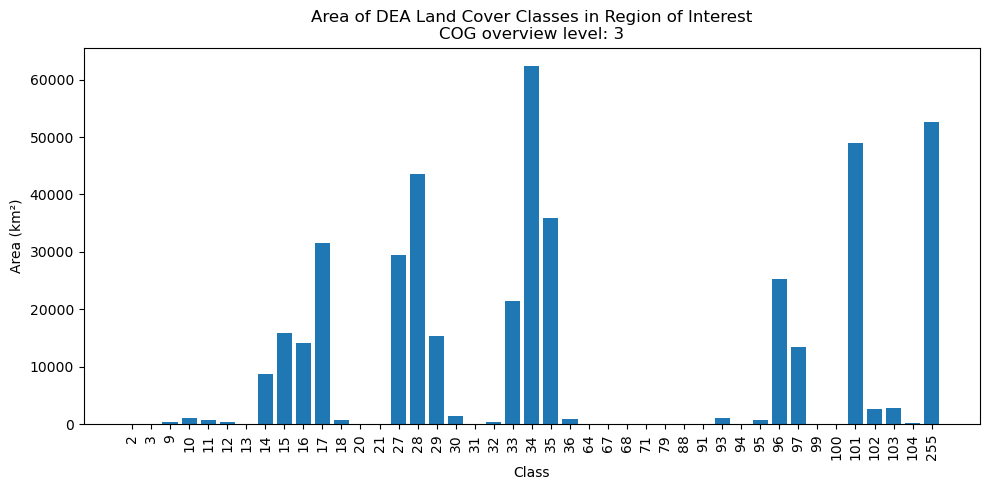

In [15]:
x_pos = np.arange(len(classes)) # positions of x axis ticks

plt.figure(figsize=(10,5))

# Plot area in km² per class
plt.bar(x_pos, area_km2)

plt.xlabel('Class')
plt.ylabel('Area (km²)')
plt.title(f'Area of DEA Land Cover Classes in Region of Interest\nCOG overview level: {overview_level}')

plt.xticks(x_pos, [int(c) for c in classes], rotation=90)

plt.tight_layout()
plt.show()


## Compare different overviews

In this final section, we will quickly explore the differences between overviews to raise awareness of the caveats associated with using a resampled product, particularly when representing categorical data.

In [16]:
# get the data in the native resolution
fine_overview_level = 0
fine_cog_array = rioxarray.open_rasterio(cog_url, overview_level=fine_overview_level)
fine_cog_roi = crop(fine_cog_array, roi_geom)

In [17]:
# get the highest overview 
coarse_overview_level = 6
coarse_cog_array = rioxarray.open_rasterio(cog_url, overview_level=coarse_overview_level)
coarse_cog_roi = crop(coarse_cog_array, roi_geom)

We can use `HTML` to preview the two overviews side by side. When zooming-in, it becomes clear that the higher overview has less detail.

In [18]:
viz_a = fine_cog_roi.squeeze().odc.explore()
viz_b = coarse_cog_roi.squeeze().odc.explore()

# Combine visualisations side by side
HTML(f"""
<table style="width:100%; text-align:center;">
  <tr>
    <th style="width:50%">Overview level: {fine_overview_level}</th>
    <th style="width:50%">Overview level: {coarse_overview_level}</th>
  </tr>
  <tr>
    <td>{viz_a._repr_html_()}</td>
    <td>{viz_b._repr_html_()}</td>
  </tr>
</table>
""")

Overview level: 0,Overview level: 6


We will extract the extent of each class again, and compare the fine and coarse overviews.

In [19]:
fine_data_1d = fine_cog_roi.values.flatten()
fine_data_1d = fine_data_1d[~np.isnan(fine_data_1d)]

fine_classes, fine_counts = np.unique(fine_data_1d, return_counts=True)

fine_pixel_size = 30 * (2 ** fine_overview_level) # effectively this is 30 m for the overview level 0
fine_pixel_area_km2 = (fine_pixel_size ** 2) / 1e6

In [20]:
coarse_data_1d = coarse_cog_roi.values.flatten()
coarse_data_1d = coarse_data_1d[~np.isnan(coarse_data_1d)]

coarse_classes, coarse_counts = np.unique(coarse_data_1d, return_counts=True)

coarse_pixel_size = 30 * (2 ** coarse_overview_level)
coarse_pixel_area_km2 = (coarse_pixel_size ** 2) / 1e6

Finally, by plotting the class extents of the two overviews side by side, we observe that the extent of some less common classes decreases at the coarser resolution, while the area of other more widespread classes increases.

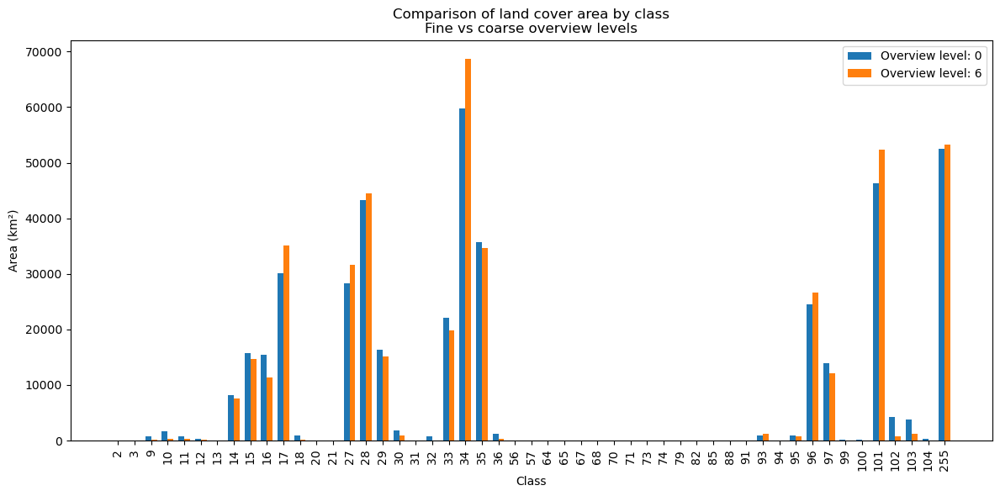

In [21]:
all_classes = np.union1d(fine_classes, coarse_classes)

# create dictionaries to store counts by class
fine_dict = dict(zip(fine_classes, fine_counts))
coarse_dict = dict(zip(coarse_classes, coarse_counts))

fine_aligned_counts = np.array([fine_dict.get(c, 0) for c in all_classes])
coarse_aligned_counts = np.array([coarse_dict.get(c, 0) for c in all_classes])

fine_aligned_area_km2 = fine_aligned_counts * fine_pixel_area_km2
coarse_aligned_area_km2 = coarse_aligned_counts * coarse_pixel_area_km2

x_pos = np.arange(len(all_classes))
width = 0.35

# plot side by side bars for fine and coarse overview areas
plt.figure(figsize=(12,6))
plt.bar(x_pos - width/2, fine_aligned_area_km2, width, label=f'Overview level: {fine_overview_level}')
plt.bar(x_pos + width/2, coarse_aligned_area_km2, width, label=f'Overview level: {coarse_overview_level}')

plt.xlabel('Class')
plt.ylabel('Area (km²)')
plt.title('Comparison of land cover area by class\nFine vs coarse overview levels')
plt.xticks(x_pos, [int(c) for c in all_classes], rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Australia data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Discord chat](https://discord.com/invite/4hhBQVas5U) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [GitHub](https://github.com/GeoscienceAustralia/dea-notebooks).

**Last modified:** July 2025

## Tags
<!-- Browse all available tags on the DEA User Guide's [Tags Index](https://knowledge.dea.ga.gov.au/genindex/) -->